# Wpływ sentymentu konsumentów do firm na ich notowanie giełdowe

## Spis treści:

### [Wstępny preprocessing danych ](#Wstępny-preprocessing-danych)

### [1. Analiza poszczególnych firm ](#1.-Analiza-poszczególnych-firm)

#### &emsp; [1.1. Analiza dzienna ](#1.1.-Analiza-dzienna)
#### &emsp; [1.2. Analiza tygodniowa ](#1.2.-Analiza-tygodniowa)
#### &emsp; [1.3. Analiza miesięczna ](#1.3.-Analiza-miesięczna)

### [2. Analiza w podziale na sektory ](#2.-Analiza-w-podziale-na-sektory)

#### &emsp; [2.1. Analiza dzienna ](#2.1.-Analiza-dzienna)
#### &emsp; [2.2. Analiza tygodniowa ](#2.2.-Analiza-tygodniowa)
#### &emsp; [2.3. Analiza miesięczna ](#2.3.-Analiza-miesięczna)

### [3. Analiza zbiorcza ](#3.-Analiza-zbiorcza)

#### &emsp; [3.1. Modele dla danych dziennych ](#3.1.-Modele-dla-danych-dziennych)

### Wstępny preprocessing danych

In [ ]:
#! pip install -U textblob
#! python -m textblob.download_corpora
# pip install statannot
#!pip install nltk==3.3
#!pip install pyspellchecker

In [1]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
import os
import seaborn as sns; sns.set(color_codes=True);
import matplotlib.pyplot as plt
import datetime
import numpy as np
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import PorterStemmer
from textblob import Word
from textblob import TextBlob
from nltk.corpus import stopwords
import string
from nltk.stem import WordNetLemmatizer

In [2]:
sid = SentimentIntensityAnalyzer()
def get_vader_score(sent):
    ss = sid.polarity_scores(sent)
    return(ss['compound'])

In [3]:
stop = stopwords.words('english')
stop = ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "youre", "youve", "youll", "youd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "shes", 'her', 'hers', 'herself', 'it', "its", 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "thatll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 's', 't', 'can', 'will', 'just', 'should', "shouldve", 'now', 'd', 'll', 'm', 'o', 're', 've', 'y', 'ain', 'ma', 'mightn', 'needn', "neednt", 'shan']

In [4]:
from spellchecker import SpellChecker
import re

WORD = re.compile(r'\w+')
spell = SpellChecker()

def reTokenize(doc):
    tokens = WORD.findall(doc)
    return tokens

def spell_correct(text):
    sptext =  [' '.join([spell.correction(w).lower() for w in reTokenize(doc)])  for doc in text]    
    return sptext    

In [5]:
from progressbar import ProgressBar
pbar = ProgressBar()

In [ ]:
dane_polaczone = pd.DataFrame({'company' : [], 'message' : [], 'created_time' : []})
st = PorterStemmer()
nan_value = float("NaN")


for filename in pbar(os.listdir(r'.\Komentarze2')):
    if filename.endswith(".xlsx"): 
        df = pd.read_excel(os.path.join(r'.\Komentarze2', filename))
        df = df.loc[(df['level'] > 1) & (df['object_type'] == "data")]
        df.replace("", nan_value, inplace=True)
        df.dropna(subset = ["message"], inplace=True)
        df.rename(columns={'path':'company'}, inplace=True)
        df['created_time'] = df['created_time'].apply(lambda x: x[0:10])
        df["company"] = df["company"].str.split("/", n = -1, expand = True)
        df['message'] = df.message.astype(str)
        df = df.drop_duplicates(subset=['message', 'created_time']) #zostaje
        df['message'] = df['message'].apply(lambda x: " ".join(x.lower() for x in x.split()))
        df['message'] = df['message'].str.replace('[^\w\s]','')
        df['message'] = df['message'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))
        df['message'] = df['message'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))
        frequnp = pd.Series(' '.join(df['message']).split()).value_counts()[-200:]
        frequnp = list(frequnp.index)
        df['message'] = df['message'].apply(lambda x: " ".join(x for x in x.split() if x not in frequnp))
        df['word_count'] = df['message'].apply(lambda x: len(str(x).split(" ")))
        df = df.loc[(df['word_count'] > 2)]
        dane_polaczone = dane_polaczone.append(df[['company', 'message', 'created_time']])

dane_polaczone.to_csv(r'.\Komentarze2\polaczone_firmy.csv', index=False)

In [6]:
dane_firmy = pd.read_csv(r'.\Komentarze2\polaczone_firmy.csv', parse_dates=['created_time'])
dane_firmy['weekno'] = dane_firmy['created_time'].dt.week
dane_firmy['month'] = (dane_firmy['created_time']).dt.strftime('%m.%Y')
dane_firmy['dayid'] = dane_firmy['company']+(dane_firmy['created_time'].apply(str))
dane_firmy['weekid'] = dane_firmy['company']+(dane_firmy['weekno'].apply(str))
dane_firmy['monthid'] = dane_firmy['company']+(dane_firmy['month'].apply(str))
dane_firmy

,company,message,created_time,weekno,month,dayid,weekid,monthid
0,Adobe,hey guy premier rush not supported huawei p20 ...,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019
1,Adobe,daniel kolasinski work well one plus phone and...,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019
2,Adobe,similar photo college,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019
3,Adobe,sara aurea lehtikangas,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019
4,Adobe,super disappointed adobe customer support not ...,2019-12-28,52,12.2019,Adobe2019-12-28 00:00:00,Adobe52,Adobe12.2019
...,...,...,...,...,...,...,...,...
1450582,walmart,oscar fuentes not cool list like,2019-01-04,1,01.2019,walmart2019-01-04 00:00:00,walmart1,walmart01.2019
1450583,walmart,manny esquivias yeah walmart paid higher wage ...,2019-01-02,1,01.2019,walmart2019-01-02 00:00:00,walmart1,walmart01.2019
1450584,walmart,diana martinez remember u hollywood,2019-01-02,1,01.2019,walmart2019-01-02 00:00:00,walmart1,walmart01.2019
1450585,walmart,el perico newspaper nothing hurricane harvey b...,2019-01-01,1,01.2019,walmart2019-01-01 00:00:00,walmart1,walmart01.2019


In [7]:
dane_firmy['sentiment'] = dane_firmy['message'].apply(lambda x: get_vader_score(x))
dane_firmy = dane_firmy.loc[(dane_firmy['sentiment'] != 0)]
dane_firmy

,company,message,created_time,weekno,month,dayid,weekid,monthid,sentiment
0,Adobe,hey guy premier rush not supported huawei p20 ...,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019,0.1376
1,Adobe,daniel kolasinski work well one plus phone and...,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019,0.7717
4,Adobe,super disappointed adobe customer support not ...,2019-12-28,52,12.2019,Adobe2019-12-28 00:00:00,Adobe52,Adobe12.2019,0.2718
5,Adobe,hi artemis sorry support experience replied pr...,2019-12-30,1,12.2019,Adobe2019-12-30 00:00:00,Adobe1,Adobe12.2019,0.8807
6,Adobe,super rude people working adobe,2019-12-28,52,12.2019,Adobe2019-12-28 00:00:00,Adobe52,Adobe12.2019,0.2263
...,...,...,...,...,...,...,...,...,...
1450580,walmart,layla michelle gatlin agree im happy but unfor...,2019-01-03,1,01.2019,walmart2019-01-03 00:00:00,walmart1,walmart01.2019,0.8910
1450582,walmart,oscar fuentes not cool list like,2019-01-04,1,01.2019,walmart2019-01-04 00:00:00,walmart1,walmart01.2019,-0.4717
1450583,walmart,manny esquivias yeah walmart paid higher wage ...,2019-01-02,1,01.2019,walmart2019-01-02 00:00:00,walmart1,walmart01.2019,0.6249
1450585,walmart,el perico newspaper nothing hurricane harvey b...,2019-01-01,1,01.2019,walmart2019-01-01 00:00:00,walmart1,walmart01.2019,0.5647


In [8]:
print(dane_firmy[['message', "sentiment"]].head(50))

                                              message  sentiment
0   hey guy premier rush not supported huawei p20 ...     0.1376
1   daniel kolasinski work well one plus phone and...     0.7717
4   super disappointed adobe customer support not ...     0.2718
5   hi artemis sorry support experience replied pr...     0.8807
6                     super rude people working adobe     0.2263
10  ever need help woth software would rather ask ...     0.8750
11  takashi murakami thought happy flower back loo...     0.5719
12  possibly least flattering vector drawing ive e...    -0.2411
13                                 lmfao quote killed    -0.2500
14  agree ann discover creativity understanding th...     0.4939
16  gosh took woman explain creativity isnt drawin...     0.1965
17     yall know use gimp asking friend billy eyelash     0.4939
18         thought wa meme lmao need spend le time fb     0.5994
19                             quentin pm lmao sameee     0.5994
20        like no decent 

## 1. Analiza poszczególnych firm

### 1.1. Analiza dzienna

In [9]:
kursy_dzienne = pd.read_excel(r'.\Kursy dzienne\kursy_dzienne.xlsx', parse_dates=['Date'], thousands=',')
kursy_dzienne['dayid'] = kursy_dzienne['company']+(kursy_dzienne['Date'].apply(str))
kursy_dzienne = kursy_dzienne[['dayid', 'company', 'Date', 'Price']]
kursy_dzienne = kursy_dzienne.sort_values(by=['dayid'])
kursy_dzienne

,dayid,company,Date,Price
503,AMD2019-01-02 00:00:00,AMD,2019-01-02,18.83
502,AMD2019-01-03 00:00:00,AMD,2019-01-03,17.05
501,AMD2019-01-04 00:00:00,AMD,2019-01-04,19.00
500,AMD2019-01-07 00:00:00,AMD,2019-01-07,20.57
499,AMD2019-01-08 00:00:00,AMD,2019-01-08,20.75
...,...,...,...,...
7816,walmart2019-12-24 00:00:00,walmart,2019-12-24,119.51
7815,walmart2019-12-26 00:00:00,walmart,2019-12-26,119.52
7814,walmart2019-12-27 00:00:00,walmart,2019-12-27,119.59
7813,walmart2019-12-30 00:00:00,walmart,2019-12-30,119.40


In [10]:
kursy_dzienne['rate_change'] = kursy_dzienne.groupby('company').Price.pct_change()
kursy_dzienne

,dayid,company,Date,Price,rate_change
503,AMD2019-01-02 00:00:00,AMD,2019-01-02,18.83,NaN
502,AMD2019-01-03 00:00:00,AMD,2019-01-03,17.05,-0.094530
501,AMD2019-01-04 00:00:00,AMD,2019-01-04,19.00,0.114370
500,AMD2019-01-07 00:00:00,AMD,2019-01-07,20.57,0.082632
499,AMD2019-01-08 00:00:00,AMD,2019-01-08,20.75,0.008751
...,...,...,...,...,...
7816,walmart2019-12-24 00:00:00,walmart,2019-12-24,119.51,0.004033
7815,walmart2019-12-26 00:00:00,walmart,2019-12-26,119.52,0.000084
7814,walmart2019-12-27 00:00:00,walmart,2019-12-27,119.59,0.000586
7813,walmart2019-12-30 00:00:00,walmart,2019-12-30,119.40,-0.001589


In [11]:
dzienne_pogrupowane = dane_firmy[['dayid', 'created_time', 'sentiment']].groupby(['dayid']).mean()
dzienne_pogrupowane

,sentiment
dayid,
AMD2019-01-01 00:00:00,0.612973
AMD2019-01-02 00:00:00,0.326644
AMD2019-01-03 00:00:00,0.326163
AMD2019-01-04 00:00:00,0.363178
AMD2019-01-05 00:00:00,0.255103
...,...
walmart2019-12-26 00:00:00,0.371717
walmart2019-12-27 00:00:00,0.412247
walmart2019-12-28 00:00:00,0.357156


In [12]:
dzienne_polaczone = pd.merge(dzienne_pogrupowane,
                 kursy_dzienne[['dayid', 'Date', 'company', 'Price', 'rate_change']],
                 on='dayid', 
                 how='inner')
dzienne_polaczone

,dayid,sentiment,Date,company,Price,rate_change
0,AMD2019-01-02 00:00:00,0.326644,2019-01-02,AMD,18.83,NaN
1,AMD2019-01-03 00:00:00,0.326163,2019-01-03,AMD,17.05,-0.094530
2,AMD2019-01-04 00:00:00,0.363178,2019-01-04,AMD,19.00,0.114370
3,AMD2019-01-07 00:00:00,0.352361,2019-01-07,AMD,20.57,0.082632
4,AMD2019-01-08 00:00:00,0.524560,2019-01-08,AMD,20.75,0.008751
...,...,...,...,...,...,...
6866,walmart2019-12-23 00:00:00,0.128829,2019-12-23,walmart,119.03,-0.010475
6867,walmart2019-12-24 00:00:00,0.398844,2019-12-24,walmart,119.51,0.004033
6868,walmart2019-12-26 00:00:00,0.371717,2019-12-26,walmart,119.52,0.000084
6869,walmart2019-12-27 00:00:00,0.412247,2019-12-27,walmart,119.59,0.000586


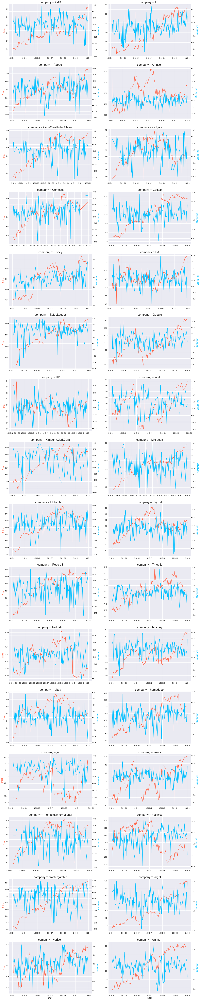

In [13]:
def facetgrid_two_axes(*args, **kwargs):
    data = kwargs.pop('data')
    dual_axis = kwargs.pop('dual_axis')
    alpha = kwargs.pop('alpha', 1)
    kwargs.pop('color')
    ax = plt.gca()
    ax.yaxis.label.set_color('tomato')
    
    if dual_axis:
        ax2 = ax.twinx()
        
    ax.plot(data['Date'],data['Price'], **kwargs, color='tomato',alpha=alpha)

    if dual_axis:
        ax2.plot(data['Date'],data['sentiment'], **kwargs, color='deepskyblue',alpha=alpha)
        ax2.set_ylabel('Sentiment', size=15)
        ax2.yaxis.label.set_color('deepskyblue')
        ax.set_ylabel('Sentiment', size=15)
        ax.set_xlabel('Sentiment', size=15)


win_plot = sns.FacetGrid(dzienne_polaczone, col='company', col_wrap = 2, height=6, aspect=1.6, sharex=False, sharey=False)
(win_plot.map_dataframe(facetgrid_two_axes, dual_axis=True)
        .set_xlabels("Date", size=15)
        .set_ylabels("Price", size=15)
        .set_titles(size=20)
)

    
plt.subplots_adjust(hspace=0.2, wspace=0.2)

plt.show()

In [14]:
dzienne_polaczone = dzienne_polaczone[~dzienne_polaczone.isin([np.nan, np.inf, -np.inf]).any(1)]
dzienne_polaczone = dzienne_polaczone[(np.abs(stats.zscore(dzienne_polaczone['sentiment'])) < 3)]
dzienne_polaczone = dzienne_polaczone[(np.abs(stats.zscore(dzienne_polaczone['rate_change'])) < 3)]

dzienne_polaczone['sent-6'] = dzienne_polaczone.groupby('company')['sentiment'].shift(-6)
dzienne_polaczone['sent-5'] = dzienne_polaczone.groupby('company')['sentiment'].shift(-5)
dzienne_polaczone['sent-4'] = dzienne_polaczone.groupby('company')['sentiment'].shift(-4)
dzienne_polaczone['sent-3'] = dzienne_polaczone.groupby('company')['sentiment'].shift(-3)
dzienne_polaczone['sent-2'] = dzienne_polaczone.groupby('company')['sentiment'].shift(-2)
dzienne_polaczone['sent-1'] = dzienne_polaczone.groupby('company')['sentiment'].shift(-1)
dzienne_polaczone['sent+1'] = dzienne_polaczone.groupby('company')['sentiment'].shift(1)
dzienne_polaczone['sent+2'] = dzienne_polaczone.groupby('company')['sentiment'].shift(2)
dzienne_polaczone['sent+3'] = dzienne_polaczone.groupby('company')['sentiment'].shift(3)
dzienne_polaczone['sent+4'] = dzienne_polaczone.groupby('company')['sentiment'].shift(4)
dzienne_polaczone['sent+5'] = dzienne_polaczone.groupby('company')['sentiment'].shift(5)
dzienne_polaczone['sent+6'] = dzienne_polaczone.groupby('company')['sentiment'].shift(6)
dzienne_polaczone

,dayid,sentiment,Date,company,Price,rate_change,sent-6,sent-5,sent-4,sent-3,sent-2,sent-1,sent+1,sent+2,sent+3,sent+4,sent+5,sent+6
4,AMD2019-01-08 00:00:00,0.524560,2019-01-08,AMD,20.75,0.008751,-0.080837,0.025600,0.402005,0.273095,0.292651,0.162839,NaN,NaN,NaN,NaN,NaN,NaN
5,AMD2019-01-09 00:00:00,0.162839,2019-01-09,AMD,20.19,-0.026988,0.571567,-0.080837,0.025600,0.402005,0.273095,0.292651,0.524560,NaN,NaN,NaN,NaN,NaN
6,AMD2019-01-10 00:00:00,0.292651,2019-01-10,AMD,19.74,-0.022288,-0.036580,0.571567,-0.080837,0.025600,0.402005,0.273095,0.162839,0.524560,NaN,NaN,NaN,NaN
7,AMD2019-01-11 00:00:00,0.273095,2019-01-11,AMD,20.27,0.026849,0.147667,-0.036580,0.571567,-0.080837,0.025600,0.402005,0.292651,0.162839,0.524560,NaN,NaN,NaN
8,AMD2019-01-14 00:00:00,0.402005,2019-01-14,AMD,20.23,-0.001973,0.140748,0.147667,-0.036580,0.571567,-0.080837,0.025600,0.273095,0.292651,0.162839,0.524560,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6866,walmart2019-12-23 00:00:00,0.128829,2019-12-23,walmart,119.03,-0.010475,NaN,NaN,0.032352,0.412247,0.371717,0.398844,0.247300,0.294241,0.297485,0.238365,0.313995,0.207269
6867,walmart2019-12-24 00:00:00,0.398844,2019-12-24,walmart,119.51,0.004033,NaN,NaN,NaN,0.032352,0.412247,0.371717,0.128829,0.247300,0.294241,0.297485,0.238365,0.313995
6868,walmart2019-12-26 00:00:00,0.371717,2019-12-26,walmart,119.52,0.000084,NaN,NaN,NaN,NaN,0.032352,0.412247,0.398844,0.128829,0.247300,0.294241,0.297485,0.238365
6869,walmart2019-12-27 00:00:00,0.412247,2019-12-27,walmart,119.59,0.000586,NaN,NaN,NaN,NaN,NaN,0.032352,0.371717,0.398844,0.128829,0.247300,0.294241,0.297485


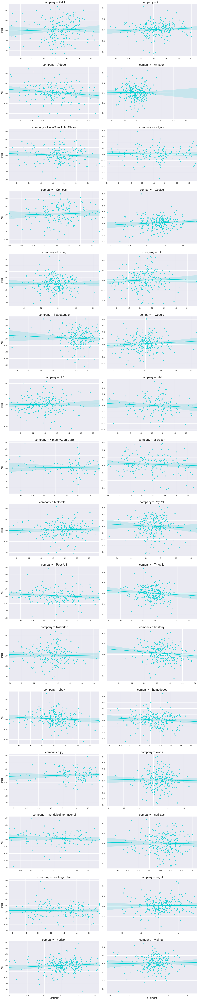

In [15]:
g = sns.FacetGrid(dzienne_polaczone, col='company', col_wrap = 2, height=6, aspect=1.6, sharex = False, sharey=False)
g.map(sns.regplot, "sentiment", "rate_change", color = "darkturquoise").set_xlabels("Sentiment", size=15).set_ylabels("Price", size=15).set_titles(size=20)
plt.subplots_adjust(hspace=0.2)

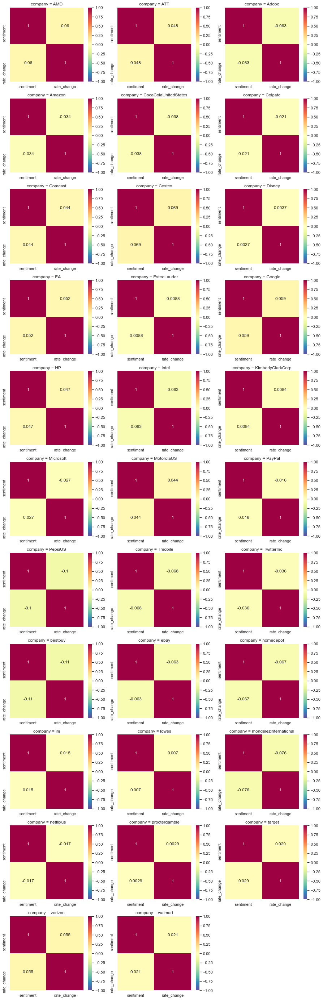

In [16]:
g = sns.FacetGrid(dzienne_polaczone[['sentiment','rate_change','company']], col='company', col_wrap=3, height=3.5, aspect=1.2, sharex = False, sharey=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r")))

### 1.2. Analiza tygodniowa

In [17]:
kursy_tygodniowe = pd.read_excel(r'.\Kursy tygodniowe\kursy_tygodniowe.xlsx', parse_dates=['Date'], thousands=',')
kursy_tygodniowe['weekno'] = kursy_tygodniowe['Date'].dt.week
kursy_tygodniowe['weekid'] = kursy_tygodniowe['company']+(kursy_tygodniowe['weekno'].apply(str))
kursy_tygodniowe = kursy_tygodniowe[['weekid', 'company', 'weekno', 'Price']]
kursy_tygodniowe = kursy_tygodniowe.sort_values(['company', 'weekno'], ascending=[True, True])
kursy_tygodniowe

,weekid,company,weekno,Price
103,AMD1,AMD,1,20.27
102,AMD2,AMD,2,20.77
101,AMD3,AMD,3,21.93
100,AMD4,AMD,4,24.51
99,AMD5,AMD,5,23.05
...,...,...,...,...
1616,walmart48,walmart,48,119.78
1615,walmart49,walmart,49,120.29
1614,walmart50,walmart,50,120.29
1613,walmart51,walmart,51,119.59


In [18]:
kursy_tygodniowe['rate_change'] = kursy_tygodniowe.groupby('company').Price.pct_change()
kursy_tygodniowe

,weekid,company,weekno,Price,rate_change
103,AMD1,AMD,1,20.27,NaN
102,AMD2,AMD,2,20.77,0.024667
101,AMD3,AMD,3,21.93,0.055850
100,AMD4,AMD,4,24.51,0.117647
99,AMD5,AMD,5,23.05,-0.059568
...,...,...,...,...,...
1616,walmart48,walmart,48,119.78,0.005794
1615,walmart49,walmart,49,120.29,0.004258
1614,walmart50,walmart,50,120.29,0.000000
1613,walmart51,walmart,51,119.59,-0.005819


In [19]:
tygodniowe_pogrupowane = dane_firmy[['sentiment', 'weekno', 'weekid']].groupby('weekid').mean()
tygodniowe_pogrupowane

,sentiment,weekno
weekid,,
AMD1,0.333005,1
AMD10,0.221304,10
AMD11,0.218607,11
AMD12,0.107471,12
AMD13,0.181167,13
...,...,...
walmart52,0.349244,52
walmart6,0.341664,6
walmart7,0.307596,7


In [20]:
tygodniowe_polaczone = pd.merge(tygodniowe_pogrupowane,
                 kursy_tygodniowe[['Price', 'rate_change', 'weekid', 'company']],
                 on='weekid', 
                 how='inner')
tygodniowe_polaczone = tygodniowe_polaczone.sort_values(['company', 'weekno'], ascending=[True, True])
tygodniowe_polaczone

,weekid,sentiment,weekno,Price,rate_change,company
0,AMD1,0.333005,1,20.27,NaN,AMD
11,AMD2,0.257211,2,20.77,0.024667,AMD
22,AMD3,0.172725,3,21.93,0.055850,AMD
33,AMD4,0.098763,4,24.51,0.117647,AMD
44,AMD5,0.180813,5,23.05,-0.059568,AMD
...,...,...,...,...,...,...
1621,walmart48,0.088458,48,119.78,0.005794,walmart
1622,walmart49,0.317353,49,120.29,0.004258,walmart
1624,walmart50,0.271319,50,120.29,0.000000,walmart
1625,walmart51,0.277980,51,119.59,-0.005819,walmart


In [21]:
tygodniowe_polaczone = tygodniowe_polaczone[~tygodniowe_polaczone.isin([np.nan, np.inf, -np.inf]).any(1)]
tygodniowe_polaczone = tygodniowe_polaczone[(np.abs(stats.zscore(tygodniowe_polaczone['sentiment'])) < 3)]
tygodniowe_polaczone = tygodniowe_polaczone[(np.abs(stats.zscore(tygodniowe_polaczone['rate_change'])) < 3)]

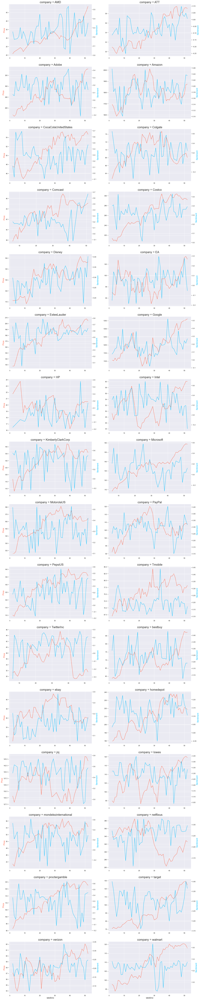

In [22]:
def facetgrid_two_axes(*args, **kwargs):
    data = kwargs.pop('data')
    dual_axis = kwargs.pop('dual_axis')
    alpha = kwargs.pop('alpha', 1)
    kwargs.pop('color')
    ax = plt.gca()
    ax.yaxis.label.set_color('tomato')
    
    if dual_axis:
        ax2 = ax.twinx()
        
    ax.plot(data['weekno'],data['Price'], **kwargs, color='tomato',alpha=alpha)

    if dual_axis:
        ax2.plot(data['weekno'],data['sentiment'], **kwargs, color='deepskyblue',alpha=alpha)
        ax2.set_ylabel('Sentiment', size=15)
        ax2.yaxis.label.set_color('deepskyblue')
        ax.set_ylabel('Sentiment', size=15)
        ax.set_xlabel('Sentiment', size=15)


win_plot = sns.FacetGrid(tygodniowe_polaczone, col='company', col_wrap = 2, height=6, aspect=1.6, sharex=False, sharey=False)
(win_plot.map_dataframe(facetgrid_two_axes, dual_axis=True)
        .set_xlabels("weekno", size=15)
        .set_ylabels("Price", size=15)
        .set_titles(size=20)
)

    
plt.subplots_adjust(hspace=0.2, wspace=0.2)

plt.show()

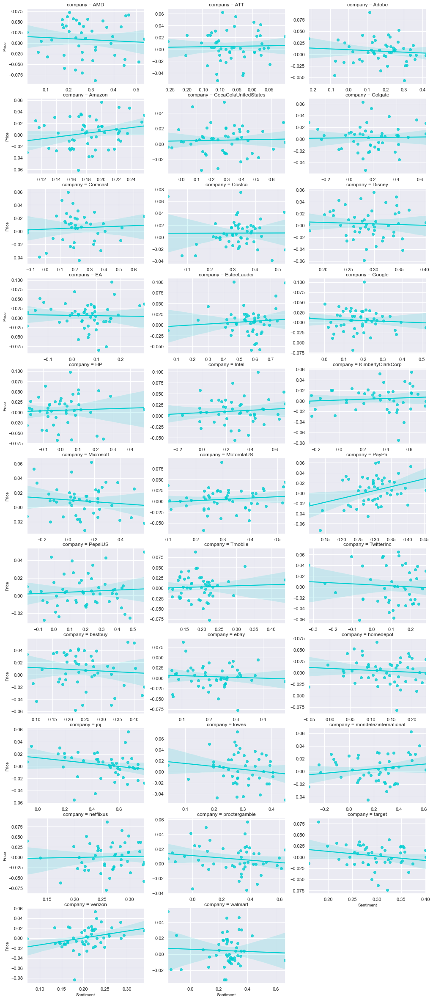

In [23]:
g = sns.FacetGrid(tygodniowe_polaczone, col='company', col_wrap = 3, height=3, aspect=1.6, sharex = False, sharey=False)
g.map(sns.regplot, "sentiment", "rate_change", color = "darkturquoise").set_xlabels("Sentiment", size=10).set_ylabels("Price", size=10).set_titles(size=12)
plt.subplots_adjust(hspace=0.2)

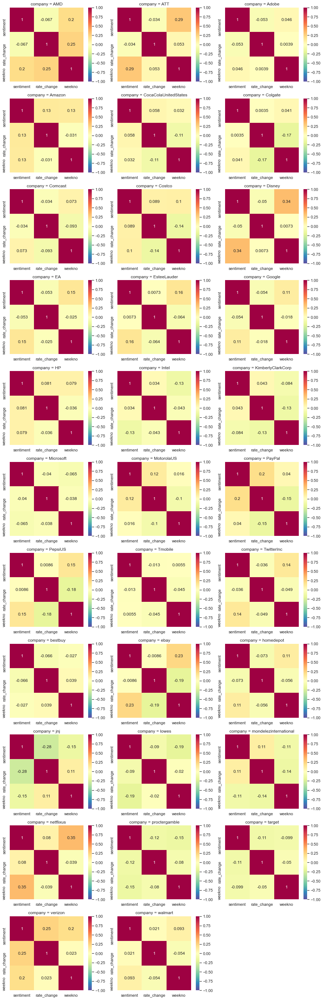

In [24]:
g = sns.FacetGrid(tygodniowe_polaczone[['sentiment','rate_change', 'weekno', 'company']], col='company', col_wrap = 3, height=3.5, aspect=1.2, sharex = False, sharey=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r")))

### 1.3. Analiza miesięczna

In [25]:
kursy_miesieczne = pd.read_excel(r'.\Kursy miesieczne\kursy_miesieczne.xlsx', parse_dates=['Date'], thousands=',')
kursy_miesieczne['month'] = pd.to_datetime(kursy_miesieczne['Date'], format='%b %y').dt.strftime('%m.%Y')
kursy_miesieczne['monthid'] = kursy_miesieczne['company']+(kursy_miesieczne['month'].apply(str))
kursy_miesieczne = kursy_miesieczne[['monthid', 'company', 'month', 'Price']]
kursy_miesieczne = kursy_miesieczne.sort_values(by=['monthid'])
kursy_miesieczne

,monthid,company,month,Price
23,AMD01.2019,AMD,01.2019,24.41
22,AMD02.2019,AMD,02.2019,23.53
21,AMD03.2019,AMD,03.2019,25.52
20,AMD04.2019,AMD,04.2019,27.63
19,AMD05.2019,AMD,05.2019,27.41
...,...,...,...,...
376,walmart08.2019,walmart,08.2019,114.26
375,walmart09.2019,walmart,09.2019,118.68
374,walmart10.2019,walmart,10.2019,117.26
373,walmart11.2019,walmart,11.2019,119.09


In [26]:
kursy_miesieczne['rate_change'] = kursy_miesieczne.groupby('company').Price.pct_change()
kursy_miesieczne

,monthid,company,month,Price,rate_change
23,AMD01.2019,AMD,01.2019,24.41,NaN
22,AMD02.2019,AMD,02.2019,23.53,-0.036051
21,AMD03.2019,AMD,03.2019,25.52,0.084573
20,AMD04.2019,AMD,04.2019,27.63,0.082680
19,AMD05.2019,AMD,05.2019,27.41,-0.007962
...,...,...,...,...,...
376,walmart08.2019,walmart,08.2019,114.26,0.035151
375,walmart09.2019,walmart,09.2019,118.68,0.038684
374,walmart10.2019,walmart,10.2019,117.26,-0.011965
373,walmart11.2019,walmart,11.2019,119.09,0.015606


In [27]:
miesieczne_pogrupowane = dane_firmy[['sentiment', 'monthid']].groupby(['monthid']).mean()
miesieczne_pogrupowane

,sentiment
monthid,
AMD01.2019,0.217565
AMD02.2019,0.229224
AMD03.2019,0.217865
AMD04.2019,0.228104
AMD05.2019,0.312638
...,...
walmart08.2019,-0.055669
walmart09.2019,0.071722
walmart10.2019,0.316462


In [28]:
miesieczne_polaczone = pd.merge(miesieczne_pogrupowane,
                 kursy_miesieczne[['Price', 'rate_change', 'monthid', 'company', 'month']],
                 on='monthid', 
                 how='inner')
miesieczne_polaczone = miesieczne_polaczone[~miesieczne_polaczone.isin([np.nan, np.inf, -np.inf]).any(1)]
miesieczne_polaczone = miesieczne_polaczone[(np.abs(stats.zscore(miesieczne_polaczone['sentiment'])) < 3)]
miesieczne_polaczone

,monthid,sentiment,Price,rate_change,company,month
1,AMD02.2019,0.229224,23.53,-0.036051,AMD,02.2019
2,AMD03.2019,0.217865,25.52,0.084573,AMD,03.2019
3,AMD04.2019,0.228104,27.63,0.082680,AMD,04.2019
4,AMD05.2019,0.312638,27.41,-0.007962,AMD,05.2019
5,AMD06.2019,0.265647,30.37,0.107990,AMD,06.2019
...,...,...,...,...,...,...
374,walmart08.2019,-0.055669,114.26,0.035151,walmart,08.2019
375,walmart09.2019,0.071722,118.68,0.038684,walmart,09.2019
376,walmart10.2019,0.316462,117.26,-0.011965,walmart,10.2019
377,walmart11.2019,0.287547,119.09,0.015606,walmart,11.2019


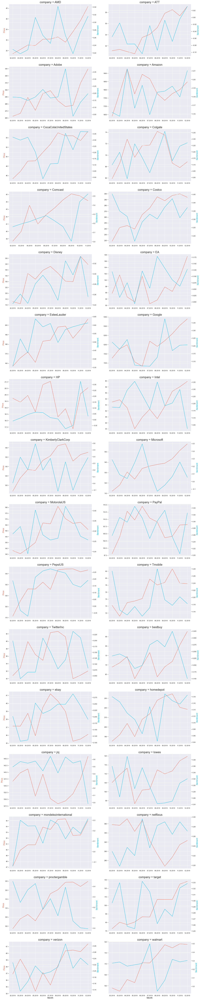

In [29]:
def facetgrid_two_axes(*args, **kwargs):
    data = kwargs.pop('data')
    dual_axis = kwargs.pop('dual_axis')
    alpha = kwargs.pop('alpha', 1)
    kwargs.pop('color')
    ax = plt.gca()
    ax.yaxis.label.set_color('tomato')
    
    if dual_axis:
        ax2 = ax.twinx()
        
    ax.plot(data['month'],data['Price'], **kwargs, color='tomato',alpha=alpha)

    if dual_axis:
        ax2.plot(data['month'],data['sentiment'], **kwargs, color='deepskyblue',alpha=alpha)
        ax2.set_ylabel('Sentiment', size=15)
        ax2.yaxis.label.set_color('deepskyblue')
        ax.set_ylabel('Sentiment', size=15)
        ax.set_xlabel('Sentiment', size=15)


win_plot = sns.FacetGrid(miesieczne_polaczone, col='company', col_wrap = 2, height=6, aspect=1.6, sharex=False, sharey=False)
(win_plot.map_dataframe(facetgrid_two_axes, dual_axis=True)
        .set_xlabels("Month", size=15)
        .set_ylabels("Price", size=15)
        .set_titles(size=20)
)
  
plt.subplots_adjust(hspace=0.2, wspace=0.2)

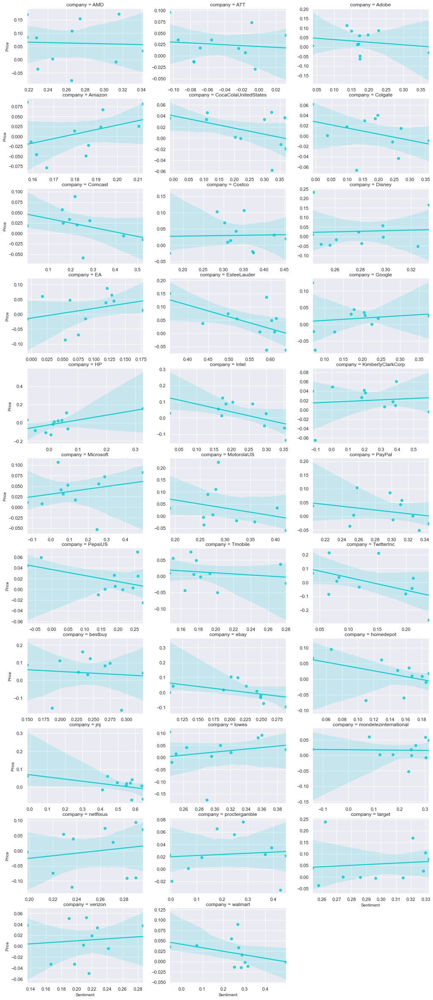

In [30]:
g = sns.FacetGrid(miesieczne_polaczone, col='company', col_wrap = 3, height=3, aspect=1.6, sharex = False, sharey=False)
g.map(sns.regplot, "sentiment", "rate_change", color = "darkturquoise").set_xlabels("Sentiment", size=10).set_ylabels("Price", size=10).set_titles(size=12)
plt.subplots_adjust(hspace=0.2)

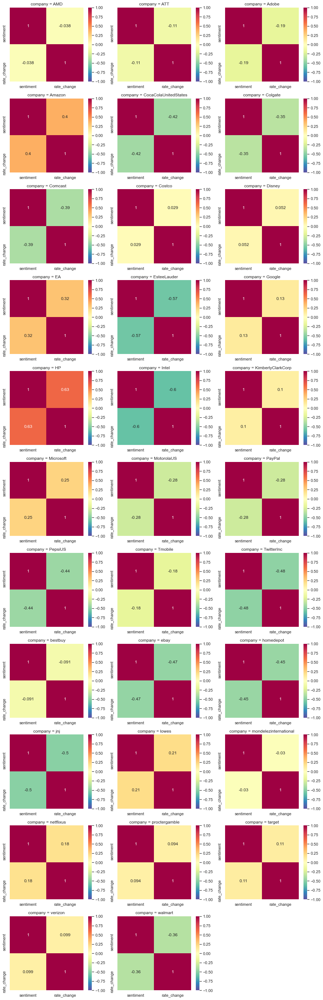

In [31]:
g = sns.FacetGrid(miesieczne_polaczone[['sentiment','rate_change','company']], col='company', col_wrap = 3, height=3.5, aspect=1.2, sharex = False, sharey=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.corr(), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r")))

## 2. Analiza w podziale na sektory

### 2.1. Analiza dzienna

In [32]:
Technology = ['Adobe', 'Google', 'PayPal', 'Intel', 'Microsoft', 'AMD', 'HP', 'MotorolaUS']
Retail = ['Amazon', 'homedepot', 'Costco', 'walmart', 'ebay', 'bestbuy', 'lowes', 'target']
FMCG = ['jnj', 'proctergamble', 'PepsiUS', 'CocaColaUnitedStates', 'Colgate', 'mondelezinternational', 'KimberlyClarkCorp', 'EsteeLauder']
CommEntert = ['Disney', 'netflixus', 'verizon', 'ATT', 'TwitterInc', 'Tmobile', 'EA', 'Comcast']

df_sektory_dzien = dzienne_polaczone
df_sektory_dzien['sector'] = df_sektory_dzien['company'].apply(lambda x: "Technology" if x in Technology else "Retail" if x in Retail else "FMCG" if x in FMCG else "CommEntert" if x in CommEntert else "Other")
df_sektory_dzien

,dayid,sentiment,Date,company,Price,rate_change,sent-6,sent-5,sent-4,sent-3,sent-2,sent-1,sent+1,sent+2,sent+3,sent+4,sent+5,sent+6,sector
4,AMD2019-01-08 00:00:00,0.524560,2019-01-08,AMD,20.75,0.008751,-0.080837,0.025600,0.402005,0.273095,0.292651,0.162839,NaN,NaN,NaN,NaN,NaN,NaN,Technology
5,AMD2019-01-09 00:00:00,0.162839,2019-01-09,AMD,20.19,-0.026988,0.571567,-0.080837,0.025600,0.402005,0.273095,0.292651,0.524560,NaN,NaN,NaN,NaN,NaN,Technology
6,AMD2019-01-10 00:00:00,0.292651,2019-01-10,AMD,19.74,-0.022288,-0.036580,0.571567,-0.080837,0.025600,0.402005,0.273095,0.162839,0.524560,NaN,NaN,NaN,NaN,Technology
7,AMD2019-01-11 00:00:00,0.273095,2019-01-11,AMD,20.27,0.026849,0.147667,-0.036580,0.571567,-0.080837,0.025600,0.402005,0.292651,0.162839,0.524560,NaN,NaN,NaN,Technology
8,AMD2019-01-14 00:00:00,0.402005,2019-01-14,AMD,20.23,-0.001973,0.140748,0.147667,-0.036580,0.571567,-0.080837,0.025600,0.273095,0.292651,0.162839,0.524560,NaN,NaN,Technology
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6866,walmart2019-12-23 00:00:00,0.128829,2019-12-23,walmart,119.03,-0.010475,NaN,NaN,0.032352,0.412247,0.371717,0.398844,0.247300,0.294241,0.297485,0.238365,0.313995,0.207269,Retail
6867,walmart2019-12-24 00:00:00,0.398844,2019-12-24,walmart,119.51,0.004033,NaN,NaN,NaN,0.032352,0.412247,0.371717,0.128829,0.247300,0.294241,0.297485,0.238365,0.313995,Retail
6868,walmart2019-12-26 00:00:00,0.371717,2019-12-26,walmart,119.52,0.000084,NaN,NaN,NaN,NaN,0.032352,0.412247,0.398844,0.128829,0.247300,0.294241,0.297485,0.238365,Retail
6869,walmart2019-12-27 00:00:00,0.412247,2019-12-27,walmart,119.59,0.000586,NaN,NaN,NaN,NaN,NaN,0.032352,0.371717,0.398844,0.128829,0.247300,0.294241,0.297485,Retail


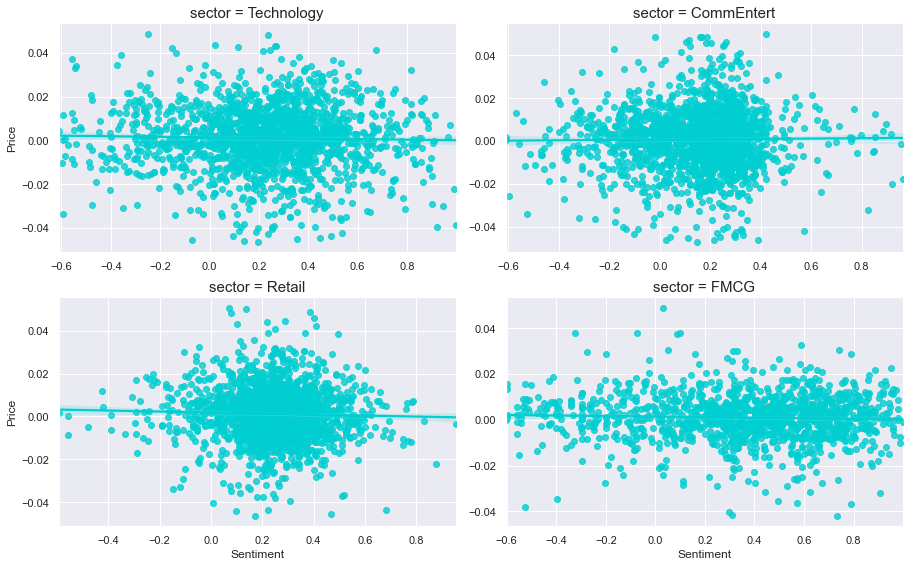

In [33]:
g = sns.FacetGrid(df_sektory_dzien, col='sector', col_wrap = 2, height=4, aspect=1.6, sharex = False, sharey=False)
g.map(sns.regplot, "sentiment", "rate_change", color = "darkturquoise").set_xlabels("Sentiment", size=12).set_ylabels("Price", size=12).set_titles(size=15)
plt.subplots_adjust(hspace=0.2)

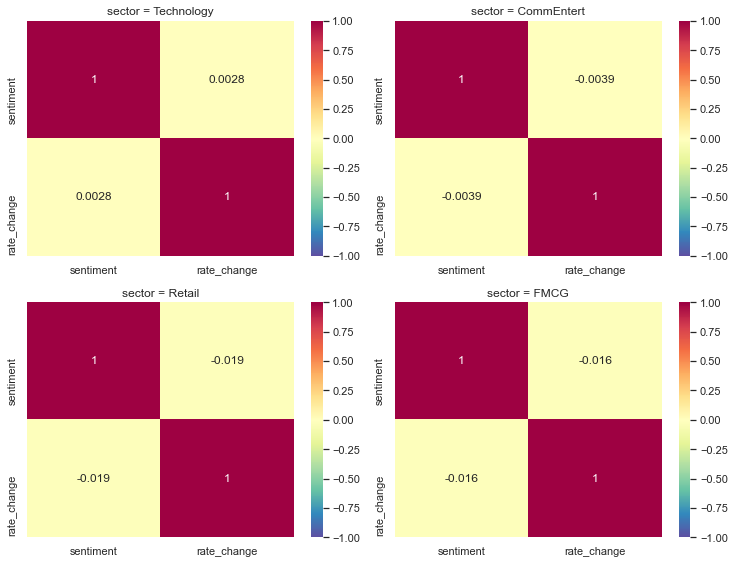

In [34]:
g = sns.FacetGrid(df_sektory_dzien[['sentiment','rate_change','sector']], col='sector', col_wrap = 2, height=4, aspect=1.3, sharex = False, sharey=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r")))

### 2.2. Analiza tygodniowa

In [35]:
df_sektory_tydzien = tygodniowe_polaczone
df_sektory_tydzien['sector'] = df_sektory_tydzien['company'].apply(lambda x: "Technology" if x in Technology else "Retail" if x in Retail else "FMCG" if x in FMCG else "CommEntert" if x in CommEntert else "Other")
df_sektory_tydzien

,weekid,sentiment,weekno,Price,rate_change,company,sector
11,AMD2,0.257211,2,20.77,0.024667,AMD,Technology
22,AMD3,0.172725,3,21.93,0.055850,AMD,Technology
44,AMD5,0.180813,5,23.05,-0.059568,AMD,Technology
48,AMD6,0.202267,6,23.68,0.027332,AMD,Technology
49,AMD7,0.303370,7,24.36,0.028716,AMD,Technology
...,...,...,...,...,...,...,...
1621,walmart48,0.088458,48,119.78,0.005794,walmart,Retail
1622,walmart49,0.317353,49,120.29,0.004258,walmart,Retail
1624,walmart50,0.271319,50,120.29,0.000000,walmart,Retail
1625,walmart51,0.277980,51,119.59,-0.005819,walmart,Retail


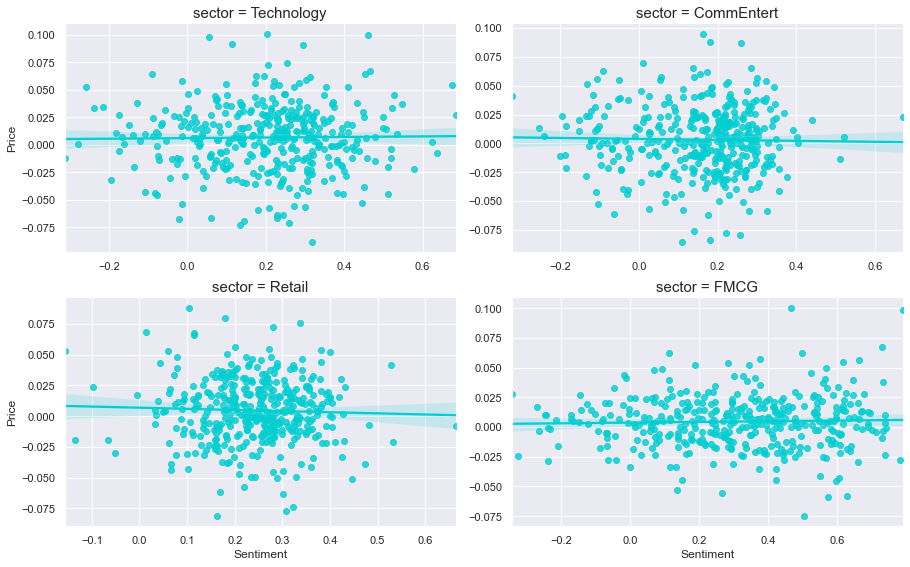

In [36]:
g = sns.FacetGrid(df_sektory_tydzien, col='sector', col_wrap = 2, height=4, aspect=1.6, sharex = False, sharey=False)
g.map(sns.regplot, "sentiment", "rate_change", color = "darkturquoise").set_xlabels("Sentiment", size=12).set_ylabels("Price", size=12).set_titles(size=15)
plt.subplots_adjust(hspace=0.2)

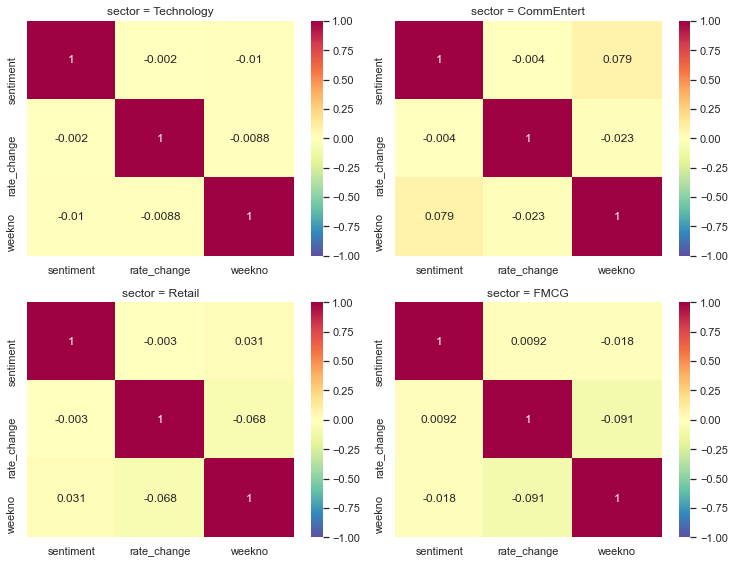

In [37]:
g = sns.FacetGrid(df_sektory_tydzien[['sentiment','rate_change','weekno', 'sector']], col='sector', col_wrap = 2, height=4, aspect=1.3, sharex = False, sharey=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r")))

### 2.3. Analiza miesięczna

In [38]:
df_sektory_miesiac = miesieczne_polaczone
df_sektory_miesiac['sector'] = df_sektory_miesiac['company'].apply(lambda x: "Technology" if x in Technology else "Retail" if x in Retail else "FMCG" if x in FMCG else "CommEntert" if x in CommEntert else "Other")
df_sektory_miesiac

,monthid,sentiment,Price,rate_change,company,month,sector
1,AMD02.2019,0.229224,23.53,-0.036051,AMD,02.2019,Technology
2,AMD03.2019,0.217865,25.52,0.084573,AMD,03.2019,Technology
3,AMD04.2019,0.228104,27.63,0.082680,AMD,04.2019,Technology
4,AMD05.2019,0.312638,27.41,-0.007962,AMD,05.2019,Technology
5,AMD06.2019,0.265647,30.37,0.107990,AMD,06.2019,Technology
...,...,...,...,...,...,...,...
374,walmart08.2019,-0.055669,114.26,0.035151,walmart,08.2019,Retail
375,walmart09.2019,0.071722,118.68,0.038684,walmart,09.2019,Retail
376,walmart10.2019,0.316462,117.26,-0.011965,walmart,10.2019,Retail
377,walmart11.2019,0.287547,119.09,0.015606,walmart,11.2019,Retail


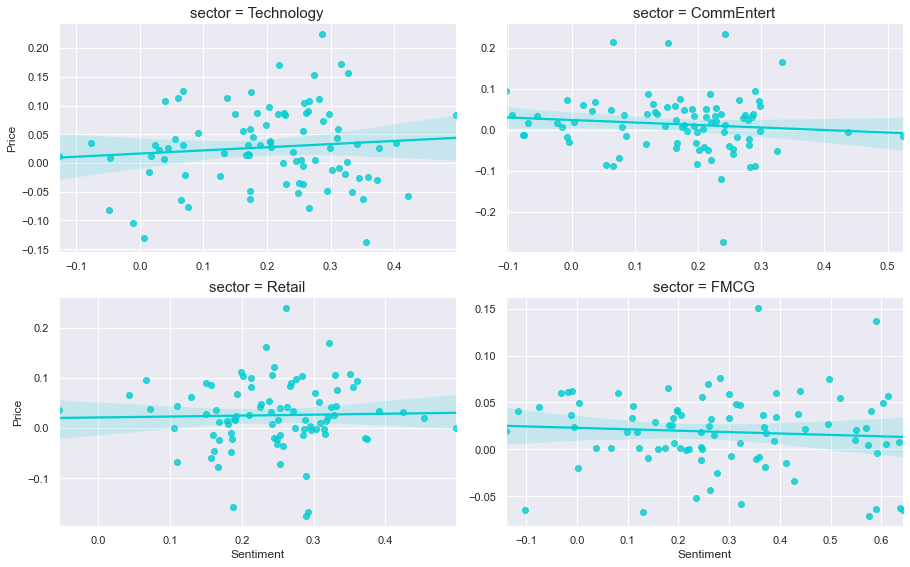

In [39]:
g = sns.FacetGrid(df_sektory_miesiac, col='sector', col_wrap = 2, height=4, aspect=1.6, sharex = False, sharey=False)
g.map(sns.regplot, "sentiment", "rate_change", color = "darkturquoise").set_xlabels("Sentiment", size=12).set_ylabels("Price", size=12).set_titles(size=15)
plt.subplots_adjust(hspace=0.2)

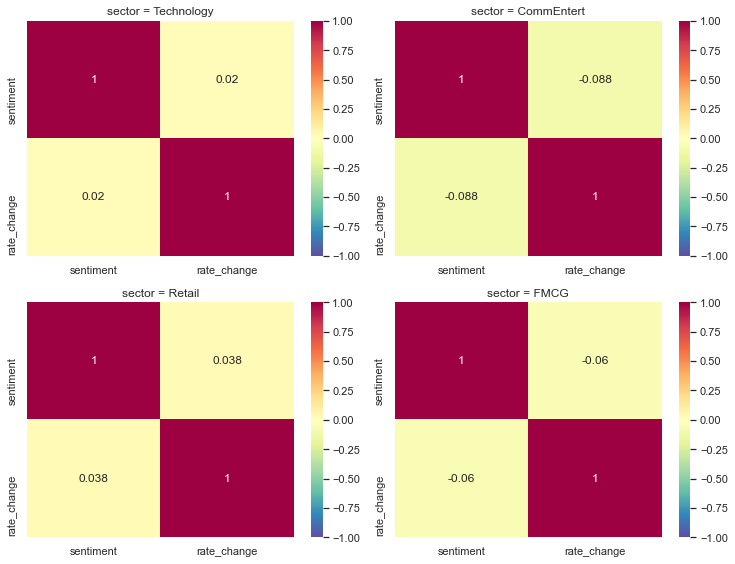

In [40]:
g = sns.FacetGrid(df_sektory_miesiac[['sentiment','rate_change','sector']], col='sector', col_wrap = 2, height=4, aspect=1.3, sharex = False, sharey=False)
g.map_dataframe(lambda data, color: sns.heatmap(data.corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r")))

## 3. Analiza zbiorcza

In [41]:
dzienne_azbiorcza = dzienne_polaczone[~dzienne_polaczone.isin([np.nan, np.inf, -np.inf]).any(1)]

tygodniowe_azbiorcza = tygodniowe_polaczone[~tygodniowe_polaczone.isin([np.nan, np.inf, -np.inf]).any(1)]

miesieczne_azbiorcza = miesieczne_polaczone[~miesieczne_polaczone.isin([np.nan, np.inf, -np.inf]).any(1)]

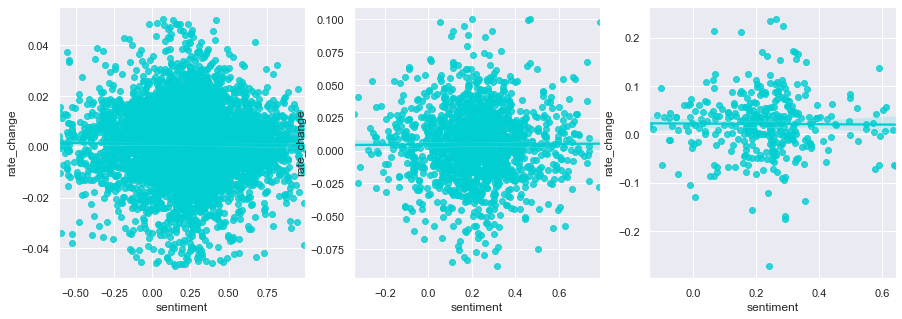

In [42]:
f, axes = plt.subplots(1, 3, figsize =[15,5])
sns.regplot(x="sentiment", y="rate_change", data = dzienne_azbiorcza, color = "darkturquoise", ax=axes[0])
sns.regplot(x="sentiment", y="rate_change", data = tygodniowe_azbiorcza, color = "darkturquoise", ax=axes[1])
sns.regplot(x="sentiment", y="rate_change", data = miesieczne_azbiorcza, color = "darkturquoise", ax=axes[2])

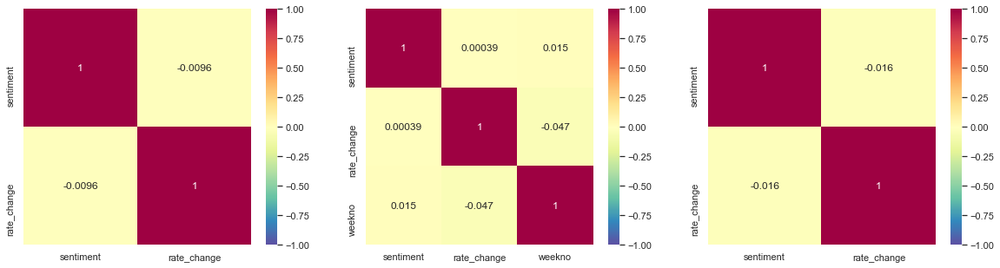

In [43]:
f, axes = plt.subplots(1, 3, figsize =[20,5])
sns.heatmap(dzienne_polaczone[['sentiment','rate_change','company']].corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r"), ax=axes[0])
sns.heatmap(tygodniowe_polaczone[['sentiment','rate_change','weekno', 'company']].corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r"), ax=axes[1])
sns.heatmap(miesieczne_polaczone[['sentiment','rate_change','company']].corr(method='kendall'), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r"), ax=axes[2])

### 3.1. Modele dla danych dziennych

#### Drzewo decyzyjne

In [44]:
X = dzienne_azbiorcza[['sentiment', 'sent-6', 'sent-5', 'sent-4', 'sent-3', 'sent-2', 'sent-1', 'sent+1', 'sent+2', 'sent+3', 'sent+4', 'sent+5', 'sent+6']]
y = dzienne_azbiorcza['rate_change']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

In [45]:
CART = tree.DecisionTreeRegressor(random_state=42,ccp_alpha=0.0)
CART_model=CART.fit(X_train,y_train)

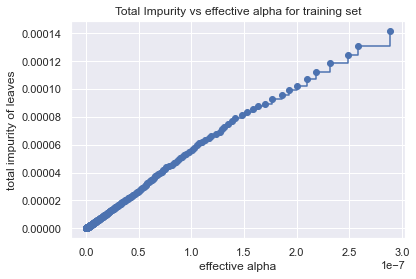

In [46]:
path = CART.cost_complexity_pruning_path(X_train, y_train) #przycinanie drzewa
ccp_alphas, impurities = path.ccp_alphas[::10], path.impurities[::10]
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set");

In [47]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = tree.DecisionTreeRegressor(random_state=42, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1])) 

Number of nodes in the last tree is: 89 with ccp_alpha: 3.185853108404914e-07


In [48]:
def RMSE(model,X,y):
    return np.sqrt(((model.predict(X)-y)**2).mean())

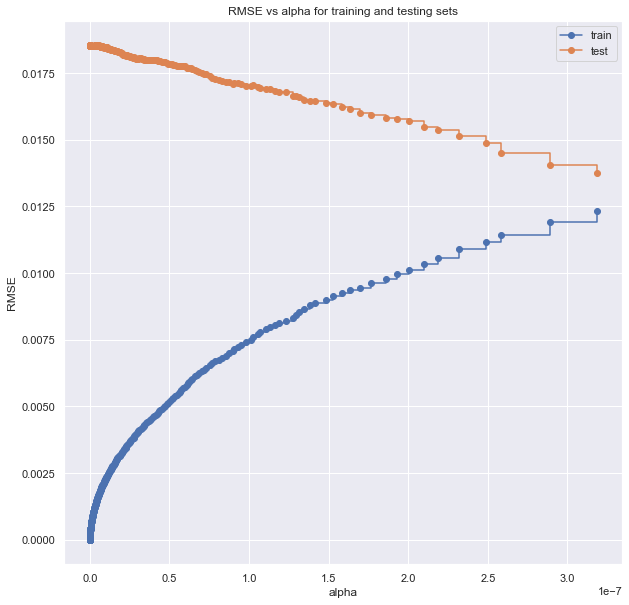

In [49]:
test_scores = [RMSE(clf,X_test,y_test) for clf in clfs]
train_scores = [RMSE(clf,X_train,y_train) for clf in clfs]

fig, ax = plt.subplots(figsize=[10,10])
ax.set_xlabel("alpha")
ax.set_ylabel("RMSE")
ax.set_title("RMSE vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [50]:
Best_CART = clfs[np.argmin(test_scores)]
Best_CART.ccp_alpha

3.185853108404914e-07

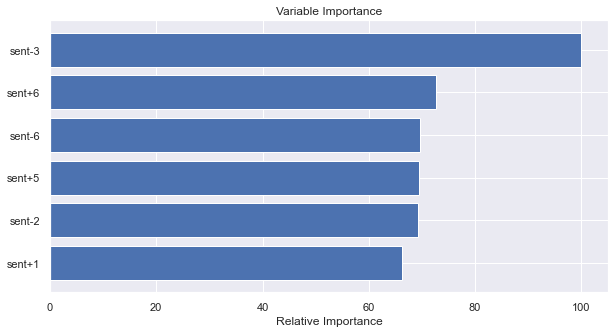

In [51]:
feature_importance = Best_CART.feature_importances_

feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
num_feat = 6
plt.figure(figsize=[10,5])
plt.barh(pos[-num_feat:], feature_importance[sorted_idx][-num_feat:], align='center')
plt.yticks(pos[-num_feat:], X_train.columns[sorted_idx][-num_feat:])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


#### Random Forest

In [52]:
X = dzienne_azbiorcza[['sentiment', 'sent-6', 'sent-5', 'sent-4', 'sent-3', 'sent-2', 'sent-1', 'sent+1', 'sent+2', 'sent+3', 'sent+4', 'sent+5', 'sent+6']]
y = dzienne_azbiorcza['rate_change']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

In [53]:
rfr = RandomForestRegressor
N = [10,50,100,200,300,400,500]
RMSE_RF= [RMSE(rfr(n,n_jobs=-1).fit(X_train,y_train),X_test,y_test) for n in N]

300

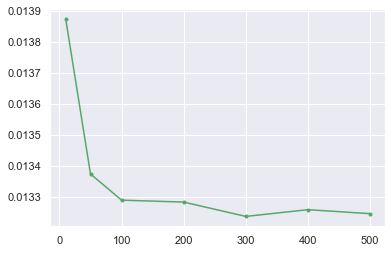

In [54]:
plt.plot(N,RMSE_RF,'.-',color='g');
N[np.argmin(RMSE_RF)]

In [55]:
features = np.linspace(1,X_train.shape[1],10).astype(int)
RMSE_RF_features= [RMSE(rfr(300,n_jobs=-1).fit(X_train,y_train),X_test,y_test) for n in features]

In [56]:
Best_RF = RandomForestRegressor(300,n_jobs=-1).fit(X_train,y_train)

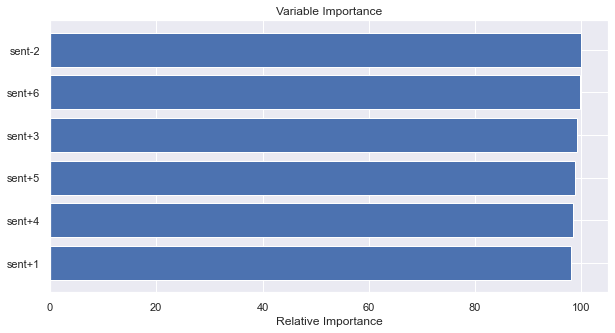

In [57]:
feature_importance = Best_RF.feature_importances_

feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
num_feat = 6
plt.figure(figsize=[10,5])
plt.barh(pos[-num_feat:], feature_importance[sorted_idx][-num_feat:], align='center')
plt.yticks(pos[-num_feat:], X_train.columns[sorted_idx][-num_feat:])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


#### Gradient boosting trees

In [58]:
X = dzienne_azbiorcza[['sentiment', 'sent-6', 'sent-5', 'sent-4', 'sent-3', 'sent-2', 'sent-1', 'sent+1', 'sent+2', 'sent+3', 'sent+4', 'sent+5', 'sent+6']]
y = dzienne_azbiorcza['rate_change']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2, random_state = 42)

10

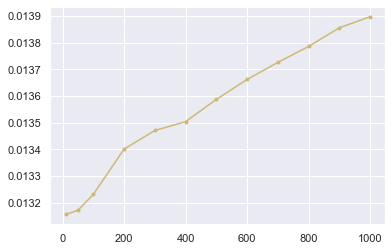

In [59]:
gbr = GradientBoostingRegressor
N = [10,50,100,200,300,400,500,600,700,800,900,1000]
RMSE_GBT = [RMSE(gbr(n_estimators=n).fit(X_train,y_train),X_test,y_test) for n in N]

plt.plot(N,RMSE_GBT,'.-',color='y');
N[np.argmin(RMSE_GBT)]

In [60]:
Best_GBT = GradientBoostingRegressor(n_estimators=10).fit(X_train,y_train)

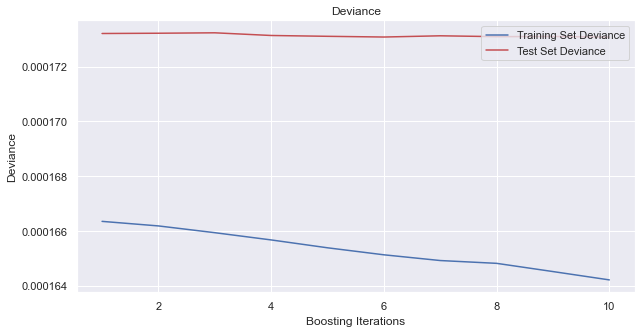

In [61]:
test_score = np.zeros((10,), dtype=np.float64)

for i, y_pred in enumerate(Best_GBT.staged_predict(X_test)):
    test_score[i] = Best_GBT.loss_(y_test, y_pred)

plt.figure(figsize=(10,5)) #tego nie
plt.title('Deviance')
plt.plot(np.arange(10) + 1, Best_GBT.train_score_, 'b-',
         label='Training Set Deviance')
plt.plot(np.arange(10) + 1, test_score, 'r-',
         label='Test Set Deviance')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Deviance');

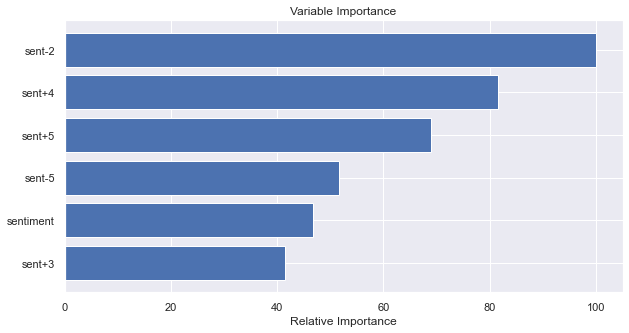

In [62]:
feature_importance = Best_GBT.feature_importances_

feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
num_feat = 6
plt.figure(figsize=[10,5])
plt.barh(pos[-num_feat:], feature_importance[sorted_idx][-num_feat:], align='center')
plt.yticks(pos[-num_feat:], X_train.columns[sorted_idx][-num_feat:])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


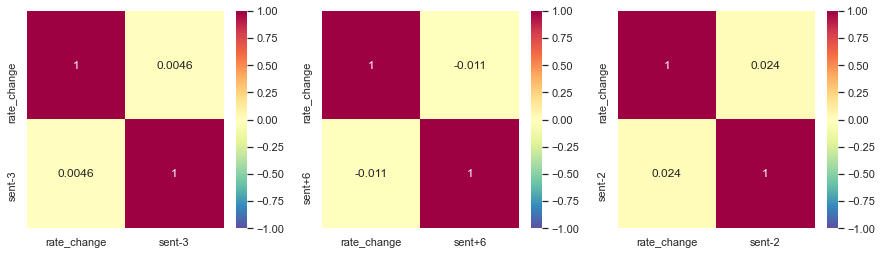

In [63]:
f, axes = plt.subplots(1, 3, figsize =[15,4])
sns.heatmap(dzienne_azbiorcza[['rate_change', 'sent-3']].corr(), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r"), ax=axes[0])
sns.heatmap(dzienne_azbiorcza[['rate_change', 'sent+6']].corr(), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r"), ax=axes[1])
sns.heatmap(dzienne_azbiorcza[['rate_change', 'sent-2']].corr(), linewidths=0, annot=True, vmin=-1, vmax=1, cmap=("Spectral_r"), ax=axes[2])